# Approximate roots of exponential polynomials

* Course: YSC4103 MCS Capstone
* Date created: 2019/02/01
* Name: Linfan XIAO
* Description: Approximate the roots of an exponential polynomial $\Delta(\lambda)$ by visualizing them as the intersections of the level curves $\Re(\Delta) = 0$ and $\Im(\Delta) = 0$.

## Importing packages and modules

In [1]:
using SymPy
using Plots

## Global variables

In [2]:
lambda = symbols("lambda")

# declare x, y as real variables
x = symbols("x", real = true)
y = symbols("y", real = true)

sympyAddExpr = 1 + x
sympyMultExpr = 2*x
sympyPowerExpr = x^2

infty = 50

50

## Helper functions

## Structs

## Main functions

In [3]:
# function to separate real and imaginary parts of an expression delta(lambda), which is an exponential polynomial in one variable
function separate_real_imaginary(delta::SymPy.Sym)
    
    # check if delta has one and only one free symbol (e.g., global variable lambda)
    if length(free_symbols(delta)) == 1
        # substitute lambda as x+iy
        expr = subs(delta, lambda, x+im*y)
        # expand the new expression and split it into individual terms
        expr = expand(expr)
        # if the expansion contains toplevel power calculations, addition, or multiplications, then it can be separated into more than one term
        if func(expr) in [func(sympyPowerExpr), func(sympyAddExpr), func(sympyMultExpr)]
            terms = args(expr)
            println("terms = $terms")
            result = 0
            # if the expanded expression contains toplevel power calculations, the expression must be of the form x^a, so terms = args(expr) = (x, a)
            if func(expr) == func(sympyPowerExpr)
                result = real(expr) + im*imag(expr)
                
            # if the expanded expression contains toplevel addition, the individual terms must all be products
            elseif func(expr) == func(sympyAddExpr)
                println(expr)
                println("addition!")
                result = 0
                for term in terms
                    println("term = $term")
                    # further split each product term into indivdual factors
                    (constant, factors) = factor_list(term)
                    termSeparated = constant
                    # separate each factor into real and imaginary parts and collect the product of separated factors
                    for (factor, power) in factors
                        factor = factor^power
                        termSeparated = termSeparated * (real(factor) + im*imag(factor))
                    end
                    println("termSeparated = $termSeparated") 
                    # collect the sum of separated term, i.e., product of separated factors
                    result = result + termSeparated
                end
                println("result = $result")
                
            # if the expanded expression contains toplevel multiplication, the individual terms must all be irreducible
            elseif func(expr) == func(sympyMultExpr)
                println(expr)
                println("multiplication!")
                result = 1
                for term in terms
                    println("term = $term")
                    # further split each term into individual factors
                    (constant, factors) = factor_list(term)
                    termSeparated = constant
                    # separate each factor into real and imaginary parts and collect the product of separated factors
                    for (factor, power) in factors
                        factor = factor^power
                        termSeparated = termSeparated * (real(factor) + im*imag(factor))
                    end
                    println("termSeparated = $termSeparated") 
                    # collect the product of separated term, i.e., product of separated factors
                    result = result * termSeparated
                end
                println("result = $result")
            end
            
        # if the expanded expression is neither of the above, it must be a single term, e.g., x or cos(x)
        else
            println(expr)
            println("single term!")
            # simply separate the single term
            term = expr
            termSeparated = real(term) + im*imag(term)
            result = termSeparated
            println("result = $result")
        end
        result = expand(result)
        return real(result) + im*imag(result)
        
    else
        throw("Delta has more than one variable")
    end
end


separate_real_imaginary (generic function with 1 method)

In [4]:
# function to plot the level curves real(Delta(lambda)) = 0 and imaginary(Delta(lambda)) = 0
function plot_level_curves(separatedDelta::SymPy.Sym; realFunc = real(separatedDelta), imagFunc = imag(separatedDelta), xRange = (-infty, infty), yRange = (-infty, infty), step = infty/1000)
    if free_symbols(separatedDelta) == [x, y]
       Plots.contour(xRange[1]:step:xRange[2], yRange[1]:step:yRange[2], realFunc, levels=[0], size = (1500, 1000), 
            tickfontsize = 20, seriescolor=:reds, transpose = false, linewidth = 4, linealpha = 1)
        Plots.contour!(xRange[1]:step:xRange[2], yRange[1]:step:yRange[2], imagFunc, levels=[0], size = (1500, 1000),
            tickfontsize = 20, seriescolor=:blues, transpose = false, linewidth = 4, linealpha = 1)
    else
        Plots.contour(xRange[1]:step:xRange[2], yRange[1]:step:yRange[2], realFunc, levels=[0], size = (1500, 1000), 
            tickfontsize = 20, seriescolor=:reds, transpose = true, linewidth = 4, linealpha = 1)
        Plots.contour!(xRange[1]:step:xRange[2], yRange[1]:step:yRange[2], imagFunc, levels=[0], size = (1500, 1000),
            tickfontsize = 20, seriescolor=:blues, transpose = true, linewidth = 4, linealpha = 1)
    end
end

plot_level_curves (generic function with 1 method)

In [5]:
# function to approximate a zero of Delta given a small range (upon inspecting the level curves)
function approximate_zero(separatedDelta::SymPy.Sym, xRange::Tuple{Number,Number}, yRange::Tuple{Number,Number}; step::Number = (xRange[2]-xRange[1])/200)
    zeroCandidates = [(0.0,0.0)]
    xList = xRange[1]:step:xRange[2]
    yList = yRange[1]:step:yRange[2]
    for xVal in xList
        for yVal in yList
            realVal = subs(real(separatedDelta), (x, xVal), (y, yVal))
            imagVal = subs(imag(separatedDelta), (x, xVal), (y, yVal))
            if isapprox(realVal, 0; atol = step) && isapprox(imagVal, 0; atol = step)
                println((xVal, yVal))
                push!(zeroCandidates, (xVal, yVal))
            end
        end
    end
    deleteat!(zeroCandidates, 1)
    zeroCandidates
end

approximate_zero (generic function with 1 method)

In [6]:
typeof([(1.0,2),(2,3)])

Array{Tuple{Real,Int64},1}

## Testing

### $\Delta(\lambda)=\lambda$

\begin{align*}
\Delta(\lambda)=\lambda = x + iy.
\end{align*}

In [7]:
lambda = symbols("lambda")
delta = lambda
separatedDelta = separate_real_imaginary(delta)

terms = (x, I*y)
x + I*y
addition!
term = x
termSeparated = x
term = I*y
termSeparated = I*y
result = x + I*y


x + I*y

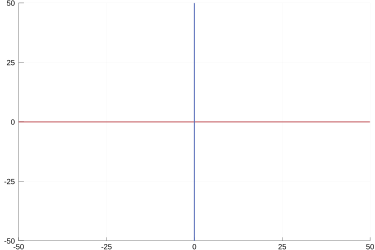

In [8]:
plot_level_curves(separatedDelta; realFunc = (x, y) -> x, imagFunc = (x, y) -> y)

In [9]:
xRange = (-0.1, 0.1)
yRange = (-0.1, 0.1)
approximate_zero(separatedDelta, xRange, yRange)

(-0.001, -0.001)
(-0.001, 0.0)
(-0.001, 0.001)
(0.0, -0.001)
(0.0, 0.0)
(0.0, 0.001)
(0.001, -0.001)
(0.001, 0.0)
(0.001, 0.001)


9-element Array{Tuple{Float64,Float64},1}:
 (-0.001, -0.001)
 (-0.001, 0.0)   
 (-0.001, 0.001) 
 (0.0, -0.001)   
 (0.0, 0.0)      
 (0.0, 0.001)    
 (0.001, -0.001) 
 (0.001, 0.0)    
 (0.001, 0.001)  

### $\Delta(\lambda)=e^\lambda$

\begin{align*}
\Delta(\lambda)=e^\lambda = e^{x+iy}=e^x e^{iy} = e^x\cos(y) + ie^x\sin(y)).
\end{align*}

In [10]:
lambda = symbols("lambda")
delta = e^(lambda)
separatedDelta = separate_real_imaginary(delta)

terms = (exp(x), exp(I*y))
exp(x)*exp(I*y)
multiplication!
term = exp(x)
termSeparated = exp(x)
term = exp(I*y)
termSeparated = I*sin(y) + cos(y)
result = (I*sin(y) + cos(y))*exp(x)


   x           x       
I*e *sin(y) + e *cos(y)

In [11]:
plot_level_curves(separatedDelta)

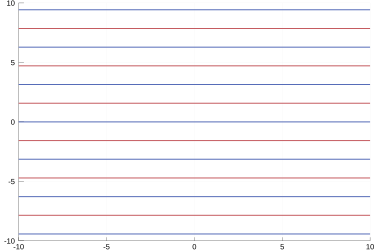

In [12]:
plot_level_curves(separatedDelta; xRange = (-10,10), yRange = (-10,10))

### $\Delta(\lambda)=\lambda^2$

\begin{align*}
\Delta(\lambda) &= \lambda^2 = (x+iy)^2 = x^2-y^2 + i2xy.
\end{align*}

In [13]:
lambda = symbols("lambda")
delta = lambda^2
separatedDelta = separate_real_imaginary(delta)

terms = (x^2, -y^2, 2*I*x*y)
x^2 + 2*I*x*y - y^2
addition!
term = x^2
termSeparated = x^2
term = -y^2
termSeparated = -y^2
term = 2*I*x*y
termSeparated = 2*I*x*y
result = x^2 + 2*I*x*y - y^2


 2              2
x  + 2*I*x*y - y 

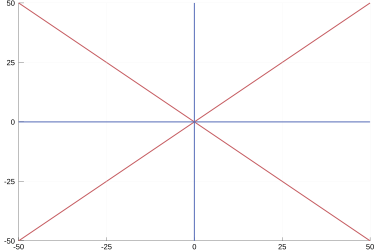

In [14]:
plot_level_curves(separatedDelta)

### $\Delta(\lambda)=\cos\lambda$

\begin{align*}
    \Delta(\lambda) &= \cos(\lambda)\\
    &= \frac{1}{2}e^{i\lambda} + \frac{1}{2}e^{-i\lambda}\\
    &= \frac{1}{2}e^{i(x+iy)} + \frac{1}{2}e^{-i(x+iy)} \\
    &= \frac{1}{2}(e^{-y}e^{ix} + e^ye^{-ix})\\
    &= \frac{1}{2}e^{-y}(\cos(x) + i\sin(x)) + \frac{1}{2}e^y(\cos(x) - i\sin(x))\\ 
    &= \cos(x)\cosh(y) - i\sin(x)\sinh(y)
\end{align*}

In [15]:
lambda = symbols("lambda")
delta = cos(lambda)
separatedDelta = separate_real_imaginary(delta)

cos(x + I*y)
single term!
result = -I*sin(x)*sinh(y) + cos(x)*cosh(y)


-I*sin(x)*sinh(y) + cos(x)*cosh(y)

In [16]:
plot_level_curves(separatedDelta)

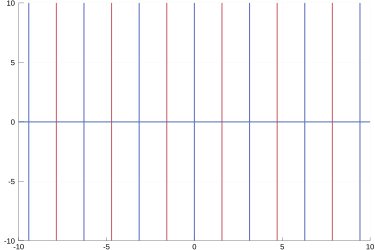

In [17]:
plot_level_curves(separatedDelta; xRange = (-10,10), yRange = (-10,10))

### $\Delta(\lambda) = \cos(\lambda)e^\lambda$

\begin{align*}
\Delta(\lambda) &= \cos(\lambda)e^\lambda\\
&= \cos(x+iy)e^{x+iy}\\
&= \cos(x+iy)e^x e^{iy}\\
&= \left[\cos(x)\cosh(y) - i\sin(x)\sinh(y)\right]e^x(\cos(y) + i\sin(y))\\
&= e^x\cos(x)\cosh(y)\cos(y) + e^x\sin(x)\sinh(y)\sin(y) + i(e^x\cos(x)\cosh(y)\sin(y)-e^x\sin(x)\sinh(y)\cos(y)).
\end{align*}

In [18]:
lambda = symbols("lambda")
delta = cos(lambda)*e^(lambda)
separatedDelta = separate_real_imaginary(delta)

terms = (cos(x + I*y), exp(x), exp(I*y))
exp(x)*exp(I*y)*cos(x + I*y)
multiplication!
term = cos(x + I*y)
termSeparated = -I*sin(x)*sinh(y) + cos(x)*cosh(y)
term = exp(x)
termSeparated = exp(x)
term = exp(I*y)
termSeparated = I*sin(y) + cos(y)
result = (I*sin(y) + cos(y))*(-I*sin(x)*sinh(y) + cos(x)*cosh(y))*exp(x)


  /   x                          x                      \    x                
I*\- e *sin(x)*cos(y)*sinh(y) + e *sin(y)*cos(x)*cosh(y)/ + e *sin(x)*sin(y)*s

          x                      
inh(y) + e *cos(x)*cos(y)*cosh(y)

In [19]:
plot_level_curves(separatedDelta)

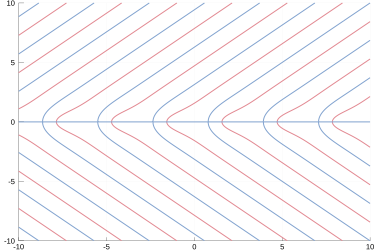

In [20]:
plot_level_curves(separatedDelta; xRange = (-10,10), yRange = (-10,10))

### $\Delta(\lambda) = \cos(\lambda)e^\lambda + \sin(\lambda)$

\begin{align*}
\Delta(\lambda) &= \cos(\lambda)e^\lambda + \sin(\lambda)\\
&= \cos(x+iy)e^{x+iy} + \sin(x+iy)\\
&= [\cos(x)\cosh(y) - i\sin(x)\sinh(y)]e^x e^{iy} + [\sin(x)\cosh(y) + i\cos(x)\sinh(y)]\\
&= [\cos(x)\cosh(y) - i\sin(x)\sinh(y)]e^x (\cos(y)+i\sin(y)) + [\sin(x)\cosh(y) + i\cos(x)\sinh(y)]\\
&= [e^x\cos(x)\cosh(y) - ie^x\sin(x)\sinh(y)](\cos(y)+i\sin(y)) + [\sin(x)\cosh(y) + i\cos(x)\sinh(y)]\\
&= \left(e^x\cos(x)\cosh(y)\cos(y) + e^x\sin(x)\sin(y)\sinh(y) + \sin(x)\cosh(y)\right) + i\left(e^x\cos(x)\sin(y)\cosh(y)-e^x\sin(x)\sinh(y)\cos(y) + \cos(x)\sinh(y)\right).
\end{align*}

In [21]:
lambda = symbols("lambda")
delta = cos(lambda)*e^(lambda) + sin(lambda)
separatedDelta = separate_real_imaginary(delta)

terms = (exp(x)*exp(I*y)*cos(x + I*y), sin(x + I*y))
exp(x)*exp(I*y)*cos(x + I*y) + sin(x + I*y)
addition!
term = exp(x)*exp(I*y)*cos(x + I*y)
termSeparated = (I*sin(y) + cos(y))*(-I*sin(x)*sinh(y) + cos(x)*cosh(y))*exp(x)
term = sin(x + I*y)
termSeparated = sin(x)*cosh(y) + I*cos(x)*sinh(y)
result = (I*sin(y) + cos(y))*(-I*sin(x)*sinh(y) + cos(x)*cosh(y))*exp(x) + sin(x)*cosh(y) + I*cos(x)*sinh(y)


  /   x                          x                                       \    
I*\- e *sin(x)*cos(y)*sinh(y) + e *sin(y)*cos(x)*cosh(y) + cos(x)*sinh(y)/ + e

x                          x                                       
 *sin(x)*sin(y)*sinh(y) + e *cos(x)*cos(y)*cosh(y) + sin(x)*cosh(y)

In [22]:
plot_level_curves(separatedDelta)

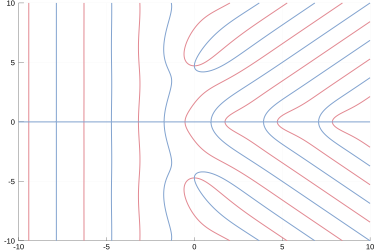

In [23]:
plot_level_curves(separatedDelta; xRange = (-10,10), yRange = (-10,10))

In [24]:
lambda = symbols("lambda")
delta = (lambda^3+lambda+2)*e^(lambda)
separatedDelta = separate_real_imaginary(delta)

terms = (2*exp(x)*exp(I*y), x*exp(x)*exp(I*y), x^3*exp(x)*exp(I*y), I*y*exp(x)*exp(I*y), -I*y^3*exp(x)*exp(I*y), -3*x*y^2*exp(x)*exp(I*y), 3*I*x^2*y*exp(x)*exp(I*y))
x^3*exp(x)*exp(I*y) + 3*I*x^2*y*exp(x)*exp(I*y) - 3*x*y^2*exp(x)*exp(I*y) + x*exp(x)*exp(I*y) - I*y^3*exp(x)*exp(I*y) + I*y*exp(x)*exp(I*y) + 2*exp(x)*exp(I*y)
addition!
term = 2*exp(x)*exp(I*y)
termSeparated = 2*(I*sin(y) + cos(y))*exp(x)
term = x*exp(x)*exp(I*y)
termSeparated = x*(I*sin(y) + cos(y))*exp(x)
term = x^3*exp(x)*exp(I*y)
termSeparated = x^3*(I*sin(y) + cos(y))*exp(x)
term = I*y*exp(x)*exp(I*y)
termSeparated = I*y*(I*sin(y) + cos(y))*exp(x)
term = -I*y^3*exp(x)*exp(I*y)
termSeparated = -I*y^3*(I*sin(y) + cos(y))*exp(x)
term = -3*x*y^2*exp(x)*exp(I*y)
termSeparated = -3*x*y^2*(I*sin(y) + cos(y))*exp(x)
term = 3*I*x^2*y*exp(x)*exp(I*y)
termSeparated = 3*I*x^2*y*(I*sin(y) + cos(y))*exp(x)
result = x^3*(I*sin(y) + cos(y))*exp(x) + 3*I*x^2*y*(I*sin(y) + cos(y))*exp(x) - 3*x*y^2*(I*sin(y) + cos(y))*exp(x) + x*(I*sin

 3  x               2    x                 2  x             x           3  x  
x *e *cos(y) - 3.0*x *y*e *sin(y) - 3.0*x*y *e *cos(y) + x*e *cos(y) + y *e *s

           x            / 3  x               2    x                 2  x      
in(y) - y*e *sin(y) + I*\x *e *sin(y) + 3.0*x *y*e *cos(y) - 3.0*x*y *e *sin(y

       x           3  x             x               x       \        x       
) + x*e *sin(y) - y *e *cos(y) + y*e *cos(y) + 2.0*e *sin(y)/ + 2.0*e *cos(y)

In [25]:
plot_level_curves(separatedDelta)

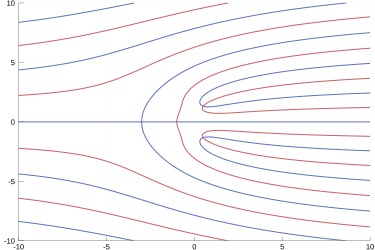

In [26]:
plot_level_curves(separatedDelta; xRange = (-10,10), yRange = (-10,10))